<a href="https://colab.research.google.com/github/TopoVague/IBC_dev/blob/main/MSD_to_IBC_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Apartment-Level Floor Plan Dataset Derived From MSD for IBC

In this notebook, we convert MSD into a information-rich and easy-to-work with dataset of apartment-level floor plans.
The notebook contains the following sections:

**(1) Apartment-level graph extraction.**
From the table (.csv) associated with the MSD floor plan dataset,
-we extract all distinct apartments that can be found in there (i.e., we develop a function that filters all the building elements corresponding to a particular apartment ID).
Each apartment (i.e., list of building elements) is subsequently converted into a richly-attributed graph, where nodes represent rooms and edges their relations.
Node attributes include the room's geometry and function.
Edge attributes include the type of connectivity and the associated geometry (e.g., geometry of the door) if such a geometry exists in the first place.
Graph-level attributes include the floor ID, apartment ID, and the sets of walls and windows (as geometries) that 'built' the apartment.
We have developed some sophisticated plotting functions in which it is remarkably easy to include your own coloring scheme, and which type of elements you want to be visualized (e.g., whether you want to see back walls, windows, doors, or entrances).

-We try to understand How useful is the dataset for our purpose which is to see how many floorplans could be fit for prefabrication by looking into it and creating some plots

**(2) Filtering.**
In here we remove apartments:
a. that belong to buildings that are not single storey but are also not high rises
b. that are too small or too large ($5 \leq N \leq 12 $, $N$ is the number of rooms),
c. that are not connected (i.e., there exist two, or more, subgraphs that do not share any edge between their corresponding sets of nodes).

**(3) Meta-data analysis.**
In this section, we provide some meta-data about the apartment-level floor plan dataset.
These meta-data regards mostly distributions, such as the distribution of the number of rooms (numeric).



## (1) Apartment-level graph extraction

This part explains how to extract the apartment-level graphs from the corresponding dataframe of MSD and, subsequently, how to nicely visualize the layouts and corresponding connectivity from these graphs.

The graph extraction algorithm in this notebook is slightly different from the one in our Github ($\longrightarrow$ [Data Curation Part 2 - Graph Extraction](https://github.com/caspervanengelenburg/msd/blob/main/NB%20-%20Data%20Curation%202%20-%20Graph%20Extraction.ipynb)):
We include more features / attributes to the nodes, edges, and the graph itself (1) and the room categorizations are slightly different (2).
The format of the data stays the same; so, if you already worked with the other graph data, it won't be difficult to modify the code to work with the ones we'll extract here.

### Loading dataframe

Here we load the MSD dataset, which is already cleaned and filtered on residential-ony floor plans. For details, see:

- Reference paper $\longrightarrow$ [MSD: A Benchmark Dataset for Floor Plan Generation of Building Complexes
](https://arxiv.org/abs/2407.10121)
- reference GitHub $\longrightarrow$ [Data Curation Part 1 - Cleaning and Filtering](https://github.com/caspervanengelenburg/msd/blob/main/NB%20-%20Data%20Curation%201%20-%20Cleaning%20and%20Filtering.ipynb)

In our case, the CSV that corresponds to the dataset is saved in in our Drive; hence, we mount our Drive first:

In [ ]:
from google.colab import drive

# Mounts drive
drive.mount('/content/drive')

Mounted at /content/drive


Next, we load the CSV as a `geopandas` dataframe:

In [ ]:
import pandas as pd
import os
from geopandas import GeoDataFrame as gdf

print(os.getcwd())  # Prints the current working directory

file_path = r"/content/drive/My Drive/MSD_V2/mds_V2_5.372k.csv"# ! change This to your directory
# Imports dataframe
if os.path.exists(file_path):
    print("File exists, proceeding with read...")
    DF = gdf(pd.read_csv(file_path))
else:
    print("File not found!")


# Checks dataset size
#print(f'Number of floors: {DF.floor_id.nunique()}')

/content
File exists, proceeding with read...


To get an idea of the information within the dataframe, let's show the top (`.head`) of it.
Note that many of the columns from the *Swiss Dwellings* dataset ($\longrightarrow$ [Swiss Dwellings](https://zenodo.org/records/7788422)) are removed, to reduce clutter.

In [ ]:
DF.head(39)  # By default, head shows 5. Let's do a bit more, say 10.

,Unnamed: 0.1,Unnamed: 0,apartment_id,site_id,building_id,plan_id,floor_id,unit_id,area_id,unit_usage,entity_type,entity_subtype,geom,elevation,height,zoning,roomtype
0,0,0,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,619311.0,RESIDENTIAL,area,BATHROOM,POLYGON ((-2.7337844078265210 4.07980744083215...,0.0,2.6,Zone3,Bathroom
1,1,1,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,619303.0,RESIDENTIAL,area,LIVING_ROOM,POLYGON ((5.8278988701887320 7.816876723402971...,0.0,2.6,Zone2,Livingroom
2,2,2,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,619322.0,RESIDENTIAL,area,ROOM,POLYGON ((6.7557107205191187 2.413369594812586...,0.0,2.6,Zone1,Bedroom
3,3,3,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,619310.0,RESIDENTIAL,area,KITCHEN,POLYGON ((3.5821200013910017 5.140461688341117...,0.0,2.6,Zone2,Kitchen
4,4,4,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,619312.0,RESIDENTIAL,area,ROOM,POLYGON ((3.0141380455489282 4.182056855151666...,0.0,2.6,Zone1,Bedroom
5,5,5,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,619314.0,RESIDENTIAL,area,BALCONY,POLYGON ((6.6332818443542809 1.893154628642479...,0.0,2.6,Zone4,Balcony
6,6,6,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,619315.0,RESIDENTIAL,area,CORRIDOR,POLYGON ((-0.8407103586364295 2.49132970436546...,0.0,2.6,Zone2,Corridor
7,7,7,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,NaN,RESIDENTIAL,separator,WALL,POLYGON ((10.1119554317056775 4.97986505334461...,0.0,2.6,Structure,Structure
8,8,8,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,NaN,RESIDENTIAL,separator,WALL,POLYGON ((-1.1111620360693770 4.87501963298749...,0.0,2.6,Structure,Structure
9,9,9,3c3b1d6ca8b4b9092480b8c75f9eaa81,210,399,1054,1588,7300.0,NaN,RESIDENTIAL,separator,WALL,POLYGON ((3.9249330187591767 -1.31971700237801...,0.0,2.6,Structure,Structure


Each element in the dataframe is an architectural element, and has a corresponding geometry (`geom`), which is a represented by polygon.
Each element is located in:

- a particular site (accessed by the column `site_id`);
- a building (`building_id`);
- a floor (`floor_id)`; and
- an apartment (`apartment_id')`.

(We leave `plan_id`, `unit_id`, and `area_id` for what they are now. I.e.: we do not need them here.)

Before we extract the geometries, let's get an idea of the separator, opening, and room types:

In [ ]:
# Show types of separators
print("The following types of separators exist in the dataset:")
print(list(DF[DF.entity_type == 'separator'].entity_subtype.unique()))

# Show types of openings
print("The following types of openings exist in the dataset:")
print(list(DF[DF.entity_type == 'opening'].entity_subtype.unique()))

# Show room types
print("The following types of spaces exist in the dataset:")
print(list(DF.roomtype.unique()))

The following types of separators exist in the dataset:
['WALL', 'COLUMN']
The following types of openings exist in the dataset:
['DOOR', 'WINDOW', 'ENTRANCE_DOOR']
The following types of spaces exist in the dataset:
['Bathroom', 'Livingroom', 'Bedroom', 'Kitchen', 'Balcony', 'Corridor', 'Structure', 'Door', 'Window', 'Entrance Door', 'Dining', 'Stairs', 'Storeroom']


Note that we will only need the `roomtype` column for all the information that we want as doors, entrance doors, and windows are already included as distinct categories already.

### Extracting geometries

Let's get the geometries associated with the walls and columns (1), doors (2), entrance doors (3), and windows (4).
We will do so for one floor (randomly sampled from the list of floor IDs in `floor_id`)

In [ ]:
from shapely import wkt

def get_geometries_from_id(df, floor_id, apartment_id=None, column='roomtype'):
    """Function that extracts all geometries and associated categories from a
    particular floor and apartment ID. Outputs a list of geometries (1) and
    a corresponding list of categories (2)."""

    # Samples dataframe based on floor and, if asked for, apartment ID
    df_floor = df[df.floor_id == floor_id].reset_index(drop=True)
    if  apartment_id is not None:
        df_floor = df_floor[df_floor.apartment_id == apartment_id].reset_index(drop=True)
    else:
        pass
    df_floor.geom = df_floor.geom.apply(wkt.loads)

    # Get geometries and associated categories out
    geoms, cats = zip(*df_floor[["geom", column]].values)

    return geoms, cats

In [ ]:
# Compute how many floors each building has
building_floors = (
    DF.dropna(subset=['building_id', 'floor_id'])
      .groupby('building_id')['floor_id']
      .nunique()
      .rename('n_floors')
)

floor_ids = list(DF.floor_id.dropna().unique())
print("Number of floor IDs in the Dataset:", len(floor_ids))
# Number of unique buildings
n_buildings = DF['building_id'].dropna().nunique()
print("Number of unique buildings in the Dataset:", n_buildings)

# Get apartment IDs
apartment_ids = list(DF.apartment_id.dropna().unique())
print("Number of unitque apartments IDs in the Dataset:", len(apartment_ids))

# Get unit IDs (Should be more!)
unit_ids = list(DF.unit_id.dropna().unique())
print("Number of unit_IDs in the Dataset:", len(unit_ids))

# Compute number of apartments
#N_apartments = 0
#for floor_id in floor_ids:
#    N_apartments += DF[DF.floor_id == floor_id].apartment_id.dropna().nunique()

#print(f"Number of apartments in the Dataset:\t{N_apartments}")

Number of floor IDs in the Dataset: 5372
Number of unique buildings in the Dataset: 2550
Number of unitque apartments IDs in the Dataset: 18269
Number of unit_IDs in the Dataset: 18902


## (1.1) Understanding the dataset

Let's plot the bulding based on the number of floor to understand a bit better our dataset

In [ ]:
!wget -q https://github.com/google/fonts/raw/main/ofl/spacegrotesk/SpaceGrotesk-Regular.ttf
# Register the font
#font_path = 'SpaceGrotesk-Regular.ttf'
#font_prop = fm.FontProperties(fname=font_path)

#plt.rcParams['font.family'] = font_prop.get_name()


Total buildings: 2550
Buildings with 2–5 floors: 1560
Example IDs: [1, 8, 9, 15, 17, 18, 19, 20, 21, 27]


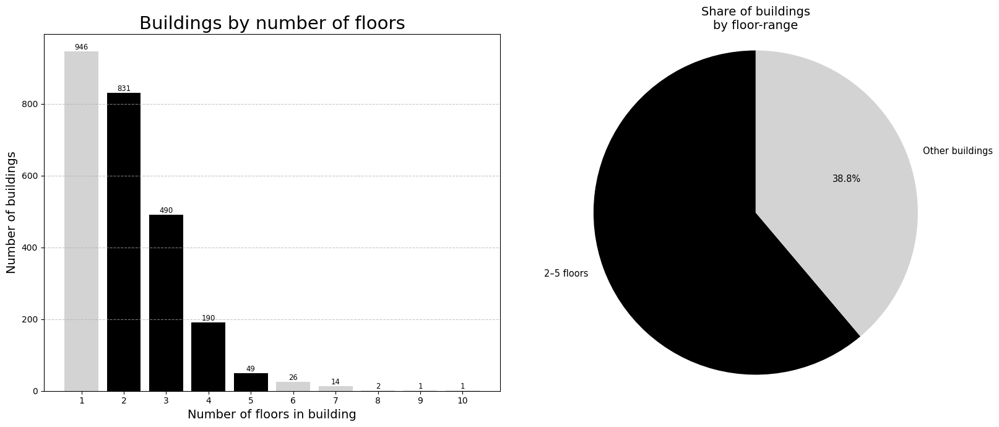

In [ ]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt


# Filter buildings with X–Y floors
minNumberOfFloors = 2
maxNumberOfFloors = 5

filtered = building_floors[(building_floors >= minNumberOfFloors) & (building_floors <= maxNumberOfFloors)]
filteredBuildinIDs = list(filtered.index)

n_total = building_floors.index.nunique()
n_filtered = len(filteredBuildinIDs)
n_other = n_total - n_filtered

print("\nTotal buildings:", n_total)
print(f"Buildings with {minNumberOfFloors}–{maxNumberOfFloors} floors:", n_filtered)
print("Example IDs:", filteredBuildinIDs[:10])


def plot_buildings_bar_and_pie(building_floors_series, filtered_ids, min_floors, max_floors):

    # --- Bar chart data ---
    counts = building_floors_series.value_counts().sort_index()

    # --- For coloring: create a color list for each floor count ---
    bar_colors = []
    for floor_count in counts.index:
        if min_floors <= floor_count <= max_floors:
            bar_colors.append("black")   # In range
        else:
            bar_colors.append("lightgray")  # Outside range

    fs = 7
    fig, axes = plt.subplots(1, 2, figsize=(fs * 2.4, fs))

    # ========================================================
    # LEFT PLOT: BAR CHART
    # ========================================================
    ax = axes[0]
    bars = ax.bar(counts.index, counts.values, color=bar_colors)

    ax.set_xlabel("Number of floors in building", fontsize=fs * 2)
    ax.set_ylabel("Number of buildings", fontsize=fs * 2)
    ax.set_title("Buildings by number of floors", fontsize=fs * 3)

    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_xticks(counts.index)

    # Add labels on top of bars
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height,
            str(int(height)),
            ha='center', va='bottom',
            fontsize=fs * 1.2
        )

    # ========================================================
    # RIGHT PLOT: PIE CHART
    # ========================================================
    ax2 = axes[1]

    sizes = [n_filtered, n_other]
    labels = [f"{min_floors}–{max_floors} floors", "Other buildings"]

    # colors match the bar chart: black for filtered, grey for others
    pie_colors = ["black", "lightgray"]

    ax2.pie(
        sizes,
        labels=labels,
        colors=pie_colors,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': fs * 1.5}
    )

    ax2.set_title("Share of buildings\nby floor-range", fontsize=fs * 2)
    ax2.axis('equal')  # Keep circle proportions

    plt.tight_layout()
    plt.show()


# Call it:
plot_buildings_bar_and_pie(building_floors, filteredBuildinIDs, minNumberOfFloors, maxNumberOfFloors)


Compute total floor area for each floor, filter plans based on that and select one floor plan

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from shapely import wkt

# -------------------------------------------------
# 1. Compute total area for each floor (using area_id, in mm²)
# -------------------------------------------------
conversionFactor = 1_000_000  # mm² → m²

floor_areas = (
    DF.dropna(subset=['floor_id', 'area_id'])
      .groupby('floor_id')['area_id']
      .sum()
      .rename('floor_area')
)

# Filter floorplans by min/max area (in m², converted to mm²)
min_area_m2 = 80
max_area_m2 = 300

min_area = min_area_m2 * conversionFactor
max_area = max_area_m2 * conversionFactor

filteredFloorAreas = floor_areas[(floor_areas >= min_area) & (floor_areas <= max_area)]
filteredFloorIDs = list(filteredFloorAreas.index)

print("Number of matching floors:", len(filteredFloorIDs))
print("Filtered floor IDs:", filteredFloorIDs)

# Pick one floor by index inside the filtered list
###########################################

#IMPORTANT SELECT A BUILDING BY INDEX HERE
selectedFloorIndex = 25 # change as needed
floor_id = filteredFloorIDs[selectedFloorIndex]

# Building ID for this floor
building_id_of_floor = (
    DF.loc[DF.floor_id == floor_id, 'building_id']
      .dropna()
      .unique()
)
selected_building_id = building_id_of_floor[0] if len(building_id_of_floor) > 0 else None

print("Selected floor_id:", floor_id)
print("Building ID(s) for this floor:", building_id_of_floor)

# -------------------------------------------------
# 2. Apartments per floor (for filtered floors, grouped by building, ≤ 40 apts)
# -------------------------------------------------
df_apts_filtered = DF[
    DF.floor_id.isin(filteredFloorIDs) &
    DF.apartment_id.notna()
].copy()

# One row per (building, floor) with number of apartments
df_apts_per_floor = (
    df_apts_filtered
    .groupby(['building_id', 'floor_id'])['apartment_id']
    .nunique()
    .reset_index(name='n_apts')
)

# Keep only floors with <= 40 apartments
df_apts_per_floor = df_apts_per_floor[df_apts_per_floor['n_apts'] <= 40]

print("\nFloors (≤40 apartments) and their apartment counts:")
print(df_apts_per_floor.head())

# -------------------------------------------------
# 3. Floor sizes (m²) for filtered floors
# -------------------------------------------------
filteredFloorAreas_sqm = filteredFloorAreas / conversionFactor

# -------------------------------------------------
# 4. Apartment sizes (all filtered floors) from geometry
# -------------------------------------------------
df_apts_geom = DF[
    DF.floor_id.isin(filteredFloorIDs) &
    DF.apartment_id.notna() &
    (DF.entity_type == 'area')
].copy()

df_apts_geom['geometry'] = df_apts_geom['geom'].apply(wkt.loads)
df_apts_geom['area_geom_sqm'] = df_apts_geom['geometry'].apply(lambda g: g.area)

apartment_sizes_filtered = (
    df_apts_geom
    .groupby('apartment_id', as_index=False)['area_geom_sqm']
    .sum()
    .rename(columns={'area_geom_sqm': 'apartment_size_sqm'})
)

print("\nNumber of apartments (all filtered floors):", len(apartment_sizes_filtered))

# -------------------------------------------------
# 5. Apartment sizes on the SELECTED floor (geometry)
# -------------------------------------------------
df_floor = DF[
    (DF.floor_id == floor_id) &
    DF.apartment_id.notna() &
    (DF.entity_type == 'area')
].copy()

df_floor['geometry'] = df_floor['geom'].apply(wkt.loads)
df_floor['area_geom_sqm'] = df_floor['geometry'].apply(lambda g: g.area)

apartment_sizes_floor = (
    df_floor
    .groupby('apartment_id', as_index=False)['area_geom_sqm']
    .sum()
    .rename(columns={'area_geom_sqm': 'apartment_size_sqm'})
)

print("\nApartments on selected floor:", len(apartment_sizes_floor))




Number of matching floors: 200
Filtered floor IDs: [4611, 4612, 4613, 4614, 4840, 4847, 4848, 4849, 4914, 4916, 4917, 4918, 4919, 4920, 4921, 5196, 5197, 5199, 5204, 6706, 6709, 6710, 6711, 8713, 8714, 8719, 10282, 11283, 11479, 11736, 11737, 11738, 11739, 11740, 13024, 13298, 13299, 13300, 13366, 13369, 13370, 13372, 13432, 13749, 13753, 14332, 14333, 14404, 14933, 15120, 15121, 15130, 15131, 29793, 29794, 29851, 29852, 29854, 29855, 29857, 29859, 40789, 40795, 40896, 40911, 41006, 41997, 42842, 44375, 44429, 46509, 46510, 46511, 46514, 46664, 46665, 47102, 47115, 47137, 47409, 47555, 47556, 47557, 47636, 47744, 47750, 47835, 47850, 47852, 47857, 47991, 48157, 48158, 48192, 48196, 48197, 48285, 48289, 48302, 48318, 48361, 48732, 48781, 48784, 48788, 48789, 48792, 48837, 48838, 49018, 49044, 49046, 49297, 49314, 49318, 49359, 49368, 49369, 49375, 49376, 49377, 49399, 49475, 49476, 49477, 49479, 49480, 49488, 49516, 49517, 49518, 49519, 49520, 49581, 49616, 49632, 49633, 49634, 49635, 4

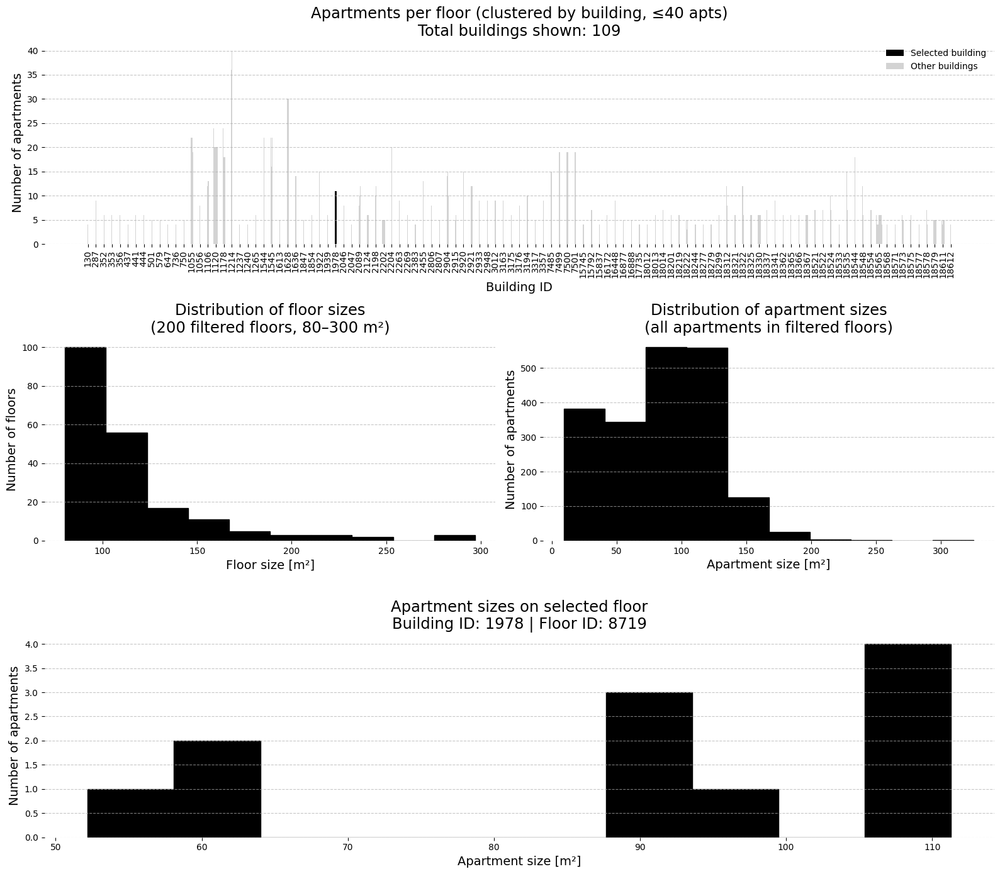

In [ ]:
# PLOT
# Deinfe Plot layout:
# Row 1: grouped bars per building (floors ≤ 40 apts, clustered by building, selected building highlighted)
# Row 2: floor sizes (left) + apartment sizes (right)
# Row 3: selected floor apartment sizes (full width)
# -------------------------------------------------
fig = plt.figure(figsize=(16, 14))
gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 1])

ax_top = fig.add_subplot(gs[0, :])   # Row 1 (full width)
ax_fs  = fig.add_subplot(gs[1, 0])   # Row 2, left
ax_as  = fig.add_subplot(gs[1, 1])   # Row 2, right
ax_sel = fig.add_subplot(gs[2, :])   # Row 3 (full width)

fs = 7  # base font scale factor

# ---------- Row 1: grouped bars per building ----------
# Unique buildings that have at least one floor in df_apts_per_floor
buildings = df_apts_per_floor['building_id'].unique()
n_buildings = len(buildings)

# Max number of floors per building (for cluster width)
max_floors_per_bldg = (
    df_apts_per_floor
    .groupby('building_id')['floor_id']
    .nunique()
    .max()
)

x_centers = np.arange(n_buildings)
bar_width = 0.8 / max_floors_per_bldg  # cluster width ~0.8

for b_idx, b_id in enumerate(buildings):
    subset = df_apts_per_floor[df_apts_per_floor['building_id'] == b_id].copy()
    # sort floors (optional: by floor_id)
    subset = subset.sort_values('floor_id')
    num_floors = len(subset)

    # Center the cluster around x_centers[b_idx]
    offsets = (np.arange(num_floors) - (num_floors - 1) / 2) * bar_width

    for (offset, (_, row)) in zip(offsets, subset.iterrows()):
        x = x_centers[b_idx] + offset
        # Highlight selected building in black, others in lightgray
        color = 'black' if (selected_building_id is not None and row['building_id'] == selected_building_id) else 'lightgray'
        ax_top.bar(x, row['n_apts'], width=bar_width, color=color)

ax_top.set_title(
    f"Apartments per floor (clustered by building, ≤40 apts)\nTotal buildings shown: {n_buildings}",
    fontsize=fs * 2.5
)
ax_top.set_xlabel("Building ID", fontsize=fs * 2)
ax_top.set_ylabel("Number of apartments", fontsize=fs * 2)
ax_top.grid(axis='y', linestyle='--', alpha=0.7)

ax_top.set_xticks(x_centers)
ax_top.set_xticklabels(buildings.astype(str), rotation=90)

# remove outline
for spine in ax_top.spines.values():
    spine.set_visible(False)

# Optional small legend for highlight
from matplotlib.patches import Patch
legend_handles = [
    Patch(facecolor='black', label='Selected building'),
    Patch(facecolor='lightgray', label='Other buildings')
]
ax_top.legend(handles=legend_handles, frameon=False)

# ---------- Row 2, left: distribution of floor sizes ----------
ax_fs.hist(
    filteredFloorAreas_sqm.values,
    bins=10,
    edgecolor='black',
    color='black'
)

ax_fs.set_title(
    f"Distribution of floor sizes\n({len(filteredFloorIDs)} filtered floors, {min_area_m2}–{max_area_m2} m²)",
    fontsize=fs * 2.5
)
ax_fs.set_xlabel("Floor size [m²]", fontsize=fs * 2)
ax_fs.set_ylabel("Number of floors", fontsize=fs * 2)
ax_fs.grid(axis='y', linestyle='--', alpha=0.7)

for spine in ax_fs.spines.values():
    spine.set_visible(False)

# ---------- Row 2, right: distribution of apartment sizes (all filtered floors) ----------
ax_as.hist(
    apartment_sizes_filtered['apartment_size_sqm'].dropna(),
    bins=10,
    edgecolor='black',
    color='black'
)

ax_as.set_title(
    f"Distribution of apartment sizes\n(all apartments in filtered floors)",
    fontsize=fs * 2.5
)
ax_as.set_xlabel("Apartment size [m²]", fontsize=fs * 2)
ax_as.set_ylabel("Number of apartments", fontsize=fs * 2)
ax_as.grid(axis='y', linestyle='--', alpha=0.7)

for spine in ax_as.spines.values():
    spine.set_visible(False)

# ---------- Row 3: apartment sizes on selected floor ----------
ax_sel.hist(
    apartment_sizes_floor['apartment_size_sqm'].dropna(),
    bins=10,
    edgecolor='black',
    color='black'
)

ax_sel.set_title(
    f"Apartment sizes on selected floor\n"
    f"Building ID: {selected_building_id if selected_building_id is not None else 'N/A'} | "
    f"Floor ID: {floor_id}",
    fontsize=fs * 2.5
)
ax_sel.set_xlabel("Apartment size [m²]", fontsize=fs * 2)
ax_sel.set_ylabel("Number of apartments", fontsize=fs * 2)
ax_sel.grid(axis='y', linestyle='--', alpha=0.7)

for spine in ax_sel.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.show()

Let's plot the elements in one figure:

Number of apartments:			11
Number of structural elements:	258
Number of doors:				76
Number of entrances:			25
Number of windows:			48


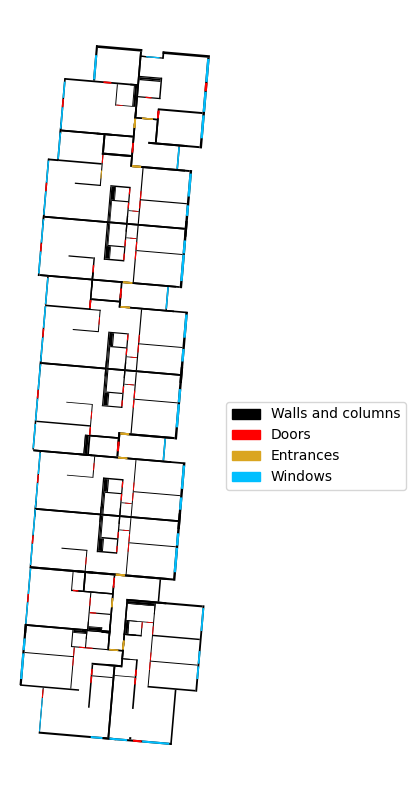

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# 4. Continue with your existing logic
apartment_ids = list(DF[DF.floor_id == floor_id].apartment_id.dropna().unique())
geoms, cats = get_geometries_from_id(DF, floor_id)

walls = [geom for geom, type in zip(geoms, cats) if type == 'Structure']
doors = [geom for geom, type in zip(geoms, cats) if type == 'Door']
entrances = [geom for geom, type in zip(geoms, cats) if type == 'Entrance Door']
windows = [geom for geom, type in zip(geoms, cats) if type == 'Window']

print(f"Number of apartments:\t\t\t{len(apartment_ids)}\n"
      f"Number of structural elements:\t{len(walls)}\n"
      f"Number of doors:\t\t\t\t{len(doors)}\n"
      f"Number of entrances:\t\t\t{len(entrances)}\n"
      f"Number of windows:\t\t\t{len(windows)}")
def plot_polygon(ax, poly, label=None, **kwargs):
    """Plots a polygon by filling it up. Edges of shapes are avoided to show exactly the area that
    the elements occupy."""
    x, y = poly.exterior.xy
    ax.fill(x, y, label=label, **kwargs)
    return

def draw_walls_and_openings(ax, geoms, cats, colors, **kwargs):
    """Draws the walls and openings of a floor layout."""

    # Extracts walls and columns (1), doors (2), entrances (3), and windows (4)
    walls = [geom for geom, type in zip(geoms, cats) if type == 'Structure']  # (1) Walls and columns
    doors = [geom for geom, type in zip(geoms, cats) if type == 'Door']  # (2) Doors
    entrances = [geom for geom, type in zip(geoms, cats) if type == 'Entrance Door']  # (3) Entrance doors
    windows = [geom for geom, type in zip(geoms, cats) if type == 'Window']  # (4) Windows

    # Plot geometries
    # Draws walls first; doors and windows 'overwrite' the walls. (Makes more sense.)
    _ = [plot_polygon(ax, geom, facecolor=colors[0]) for geom in walls]
    _ = [plot_polygon(ax, geom, facecolor=colors[1]) for geom in doors]
    _ = [plot_polygon(ax, geom, facecolor=colors[2]) for geom in entrances]
    _ = [plot_polygon(ax, geom, facecolor=colors[3]) for geom in windows]



# Set figure and specs
fs = 10
fig, ax = plt.subplots(1, 1, figsize=(fs, fs))
ax.set_aspect('equal')
ax.axis('off')

# Color palette and naming
sep_colors = ["black", "red", "goldenrod", "deepskyblue"]
sep_names = ["Walls and columns", "Doors", "Entrances", "Windows"]

# Plot geometries
draw_walls_and_openings(ax, geoms, cats, sep_colors)

# Create legend (left middle outside)
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(sep_colors, sep_names)]
_ = plt.legend(handles=patches, loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=fs)

That looks good.
We can do the same for all individual apartments on this floor.
Remember: for the floor plan above, there are 5 apartments.

In [ ]:
# Gets list of floor IDs and samples one (at 0)
floor_id = filteredFloorIDs[selectedFloorIndex]

# Gets list of apartment IDs within the given floor
apartment_ids = list(DF[DF.floor_id == floor_id].apartment_id.dropna().unique())

# Gets geometries and associated categories
geoms, cats = get_geometries_from_id(DF, floor_id)

# Get geometries and categories for each apartment ID
apartments = []
for apartment_id in apartment_ids:
    geoms, cats = get_geometries_from_id(DF, floor_id, apartment_id=apartment_id)
    apartments.append([geoms, cats])

print(len(apartments))

11


Indeed the lenght of `apartments` corresponds with the number of apartments within the overall floor plan.

Let's plot them individually.
We draw them in different subplots.
And using `unary_union` from `shapely` we construct the boundary of the overall floor plan and plot it underneath the apartments in gray.

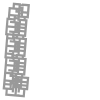

In [ ]:
import numpy as np
from shapely.ops import unary_union

# Get tightest boundary of floor plan
# First: load all geometries that are walls or columns
# Second: Unite all these geometries using the union of them
# Third: Find the polygon within the union that is largest in terms of area (using np.argsort)
# and choose the largest (which is by default put on the end of the sort)
geoms, cats = get_geometries_from_id(DF, floor_id)
structure = unary_union([geom for geom, cat in zip(geoms, cats) if cat == 'Structure'])
boundary = structure.geoms[np.argsort([geom.area for geom in structure.geoms])[-1]]

# Check whether the boundary / polygon makes sense
# (When a shapely Polygon object is called, the shape is directly visualized in the output.)
boundary

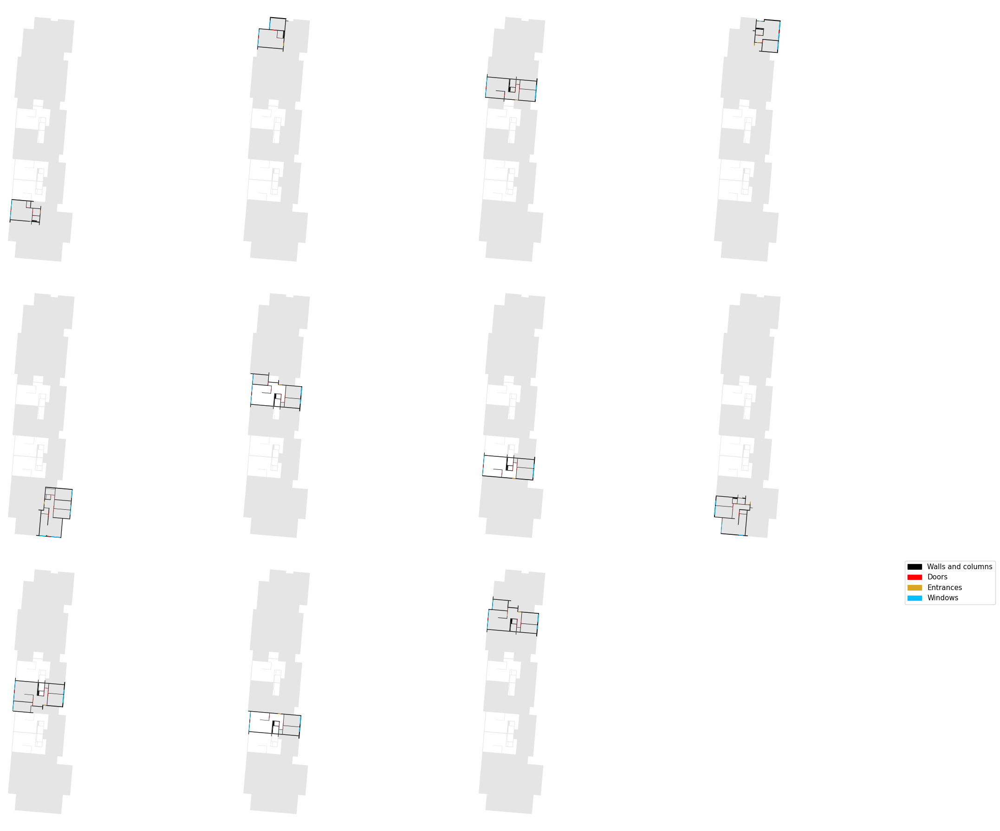

In [ ]:
import math
# Set figure and specs
# ----------------------------------------
# Auto-grid configuration
# ----------------------------------------
max_cols = 4                     # max apartments per row
n_apts = len(apartments)         # total apartments
n_cols = min(max_cols, n_apts)   # number of used columns
n_rows = math.ceil(n_apts / max_cols)

fs = 6  # base font scale factor

fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(fs * n_cols, fs * n_rows)
)

# Flatten to 1D list for easy iteration
axs = axs.flatten()

# ----------------------------------------
# Plot each apartment
# ----------------------------------------
for ax, (geoms, cats) in zip(axs, apartments):

    # Plot base / background
    ax.set_aspect('equal')
    ax.axis('off')

    # Plot complete building boundary
    plot_polygon(ax, boundary, facecolor="gray", alpha=0.2)

    # Plot apartment geometry
    draw_walls_and_openings(ax, geoms, cats, sep_colors)

# Hide any unused axes (e.g., if last row is partially filled)
for i in range(len(apartments), len(axs)):
    axs[i].axis('off')

# ----------------------------------------
# Legend (outside)
# ----------------------------------------
patches = [
    mpatches.Patch(color=color, label=label)
    for color, label in zip(sep_colors, sep_names)
]

plt.legend(
    handles=patches,
    loc='upper left',
    bbox_to_anchor=(1.02, 1),
    fontsize=fs * 1.8
)

plt.tight_layout()
plt.show()

You can clearly see that the floor plan is cut into the individual apartments out of which it is composed.

In the next couple of code blocks we will show the spaces as well.

In [ ]:
room_names = ['Bedroom', 'Livingroom', 'Kitchen', 'Dining', 'Corridor', 'Stairs', 'Storeroom', 'Bathroom', 'Balcony']
room_colors = [           '#D8DDCE',   # bedroom
                         '#F7F3D5',  # living room
                         '#EADED9',   # kitchen
                         '#EEDA9F',   # dining
                         'violet',   # corridor
                         '#72246c',  # stairs
                         '#E9E8E8',  # storeroom
                         '#4084B2',   # bathroom
                         'darkgrey']  # balcony

def draw_rooms(ax, geoms, cats, room_colors, room_names):
    """Draws the rooms of the floor plan layout."""

    # Simultaneously extract geometries and categories
    # And directly plot them int the correct color
    for geom, cat in zip(geoms, cats):
        if cat in room_names:
            plot_polygon(ax, geom, facecolor=room_colors[room_names.index(cat)])

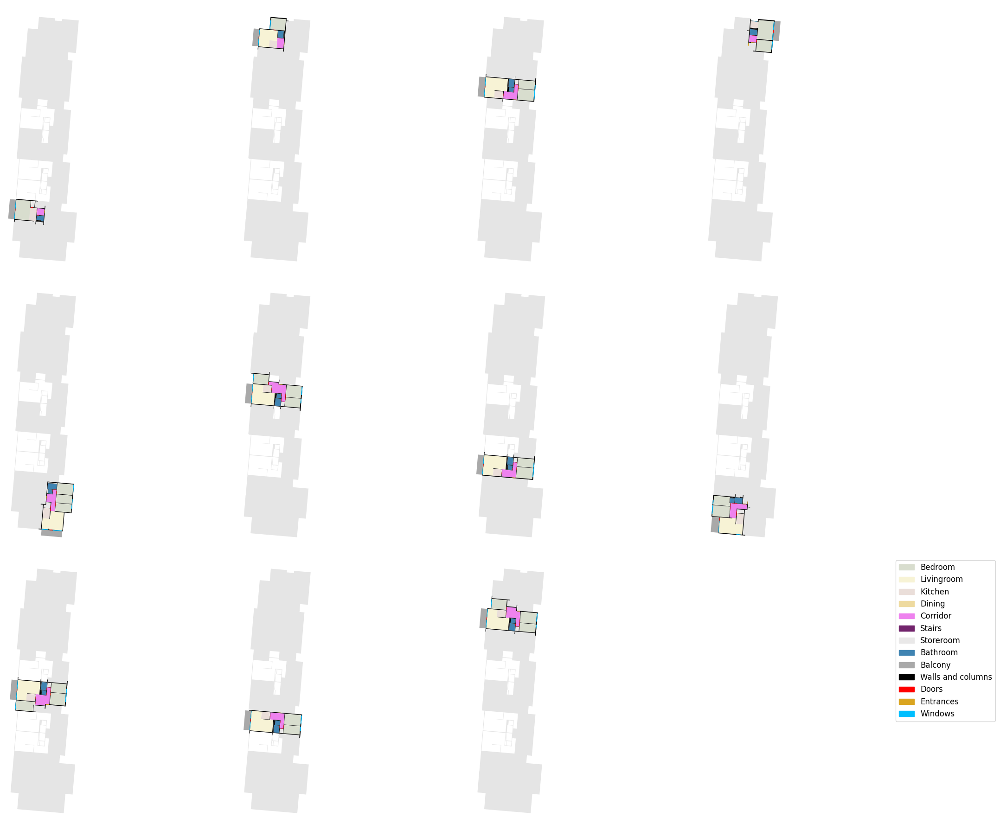

In [ ]:
import math
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Set figure and specs
max_cols = 4                     # max apartments per row
n_apts = len(apartments)         # total apartments
n_cols = min(max_cols, n_apts)   # number of used columns
n_rows = math.ceil(n_apts / max_cols)

fs = 6  # base font scale factor

fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(fs * n_cols, fs * n_rows)
)

# If there's only one row/col, axs may not be an array – make it one
axs = np.array(axs).reshape(-1)
# or: axs = axs.flatten() if you're sure it's array-like

# Loop through apartments
for ax, (geoms, cats) in zip(axs, apartments):

    # Set axis
    ax.set_aspect('equal')
    ax.axis('off')

    # Plot structure of the whole building
    plot_polygon(ax, boundary, facecolor="gray", alpha=0.2)

    # Plot geometries
    draw_rooms(ax, geoms, cats, room_colors, room_names)
    draw_walls_and_openings(ax, geoms, cats, sep_colors)

# 🔑 Hide any leftover empty axes
for i in range(len(apartments), len(axs)):
    axs[i].axis('off')

# Create legend (left middle outside)
colors = room_colors + sep_colors
names = room_names + sep_names
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(colors, names)]
plt.legend(handles=patches, loc='upper left', bbox_to_anchor=(1, 1), fontsize=fs*2)

plt.tight_layout()
plt.show()


### Extracting graphs

Now it is time to extract the graphs.
We do this per individual apartment.
For now, we will not bother about the entrances and the windows, and completely focus on the layout of the apartment as if it would be isolated from the rest of the world.

As mentioned before, the graph extraction algorithm is slightly different from our previous implemention ($\longrightarrow$ [Data Curation Part 2 - Graph Extraction](https://github.com/caspervanengelenburg/msd/blob/main/NB%20-%20Data%20Curation%202%20-%20Graph%20Extraction.ipynb)):
We include more features / attributes to the nodes, edges, and the graph itself (1) and the room categorization is slightly modified (2).
The format of the data stays the same; so, if you already worked with the other graph data, it won't be difficult to modify your code to work with the ones we'll extract here.

Graphs are stored as `nx.Graph()` data structures, which IMHO is one of the easiest-to-work-with graph containers you can find in Python.

The graph extraction algorithm below should be self-explainable from the comments.

One thing to highlight here (which is quite different from our earlier algorithm) is to way to check the connectivity by doors.
The door geometries are temporarily modified by rotating them 90 degrees and making them slightly smaller.
This means that there is more clearly overlap between the rotated door geometry and the two rooms that the door connects.
This makes the algorithm more robust to slightly misplaced doors.


In [ ]:
from warnings import catch_warnings
from types import NotImplementedType
from copy import deepcopy
from itertools import combinations
import torch
import networkx as nx
from shapely.geometry import Polygon
from shapely.affinity import rotate, scale

def rotate_rectangle(rect: Polygon, scale_factor=0.5, angle=90):
    # Compute centroid (center point)
    centroid = rect.centroid

    # Scale the rectangle (relative to the centroid)
    scaled_rect = scale(rect, xfact=scale_factor, yfact=scale_factor, origin=centroid)

    # Rotate the scaled rectangle around its center
    rotated_rect = rotate(scaled_rect, angle, origin=centroid)

    return rotated_rect

def polygon_to_list(polygon: Polygon) -> list:
    """Converts a polygon into a list of coordinates."""
    return list(zip(*polygon.exterior.coords.xy))

def extract_access_graph(geoms, cats, names, apartment_id, floor_id):
    """Extracts the access graph from a set of geometries."""

    # Sets the mapping
    mapping_names = {cat: i for i, cat in enumerate(names)}

    # Initializes empty lists for rooms and their categories, doors, and walls
    rooms, room_cats, doors, entrances, walls, windows = [], [], [], [], [], []

    # Loops through the geometries and corresponding categories
    for geom, cat in zip(geoms, cats):
        if cat ==  'Door':  # Doors
            doors.append(geom)
        elif cat ==  'Entrance Door':  # Entrances
            doors.append(geom)
            entrances.append(geom)
        elif cat in names[:9]:  # Rooms
            rooms.append(geom)
            room_cats.append(cat)
        elif cat == 'Structure':  # Walls and columns
            walls.append(geom)
        elif cat == 'Window': # Windows
            windows.append(geom)
        else: continue

    # Accumulation of NODES (i.e., the rooms)
    nodes = {}
    for key, (room, cat) in enumerate(zip(rooms, room_cats)):

        # Set node and its attributes
        nodes[key] = {
            'polygon': polygon_to_list(room),
            'category': mapping_names[cat],
            'centroid': torch.tensor(np.array([room.centroid.x, room.centroid.y]))
        }

    # Accumulation of EDGES (i.e., room to room connectivity)
    edges = []
    for (i, v1), (j, v2) in combinations(enumerate(rooms), 2):

        # (Option 1) Passage (i.e., direct access := no wall in between)
        if v1.distance(v2) < 0.04:
            edges.append([i, j, {'polygon': None, 'connectivity': 'passage'}])

        # (Option 2) Door (i.e., door in between two rooms)
        else:
            edge = False
            for door in doors + entrances:
                door_rotated = rotate_rectangle(door, scale_factor=1)
                if door_rotated.intersection(v1) and door_rotated.intersection(v2):
                    # Adds the geometry of the door as well (slightly different from paper)
                    edge = True
                    edges.append([i, j, {'polygon': polygon_to_list(door), 'connectivity': 'door'}])
                else: continue

            # (Option 2B) By window (i.e., window between balcony and other room)
            # Sometimes, balconies seem disconnected from the apartment (fully).
            # This is likely not the case. So, if a balcony connects with one of the other rooms
            # through a window it is fine as well.
            if not edge and (room_cats[i] == "Balcony" or room_cats[j] == "Balcony"):
                # Check connection based on window overlap
                for window in windows:
                    window_rotated = rotate_rectangle(window)
                    if window_rotated.intersection(v1) and window_rotated.intersection(v2):
                        edges.append([i, j, {'polygon': polygon_to_list(window), 'connectivity': 'door'}])
                    else: continue

    # Get tightest boundary of the apartment
    # (1) Unite all these wall geometries
    # (2) Find the polygon within the union that is largest in terms of area (using np.argsort)
    #   and choose the largest (which is by default put on the end of the sort)
    structure = unary_union(walls)  # (1)
    if structure.geom_type == "MultiPolygon":
        boundary = structure.geoms[np.argsort([geom.area for geom in structure.geoms])[-1]]  # (2)
    elif structure.geom_type == "Polygon":
        boundary = deepcopy(structure)
    else:
        raise NotImplementedType(f"Not implemented for {structure.geom_type}.")

    # Defines the graph
    G = nx.Graph()
    # Graph attributes / features
    G.graph["Floor ID"] = floor_id  # Floor ID
    G.graph["Apt ID"] = apartment_id  # Apartment ID (i.e., name)
    G.graph["Structure"] = walls  # Walls and columns
    G.graph["Windows"] = windows  # Windows
    G.graph["Entrances"] = entrances  # Entrances (doors)
    # Node attributes / features
    G.add_nodes_from([(u, v) for u, v in nodes.items()])
    # Edge attributes / features
    G.add_edges_from(edges)

    return G

Let's load the graphs in a list called `graphs`:

In [ ]:
from IPython.display import clear_output

# Initialize emtpy list for graphs
graphs = []

# Loop over apartments
for i, ((geoms, cats), apartment_id) in enumerate(zip(apartments, apartment_ids)):
    clear_output(wait=True)
    print(f"Graphs extracted: {i+1} / {len(apartments)}")
    G = extract_access_graph(geoms, cats, room_names, apartment_id, floor_id)
    graphs.append(G)

print(graphs[0])

Graphs extracted: 11 / 11
Graph with 6 nodes and 5 edges


Next, let's visualize the layouts including their connections from the graphs directly:

In [ ]:
from matplotlib.pyplot import get_cmap
import matplotlib.colors as mcolors

# Set color map
cmap = get_cmap(mcolors.ListedColormap(room_colors))

def draw_floor_from_graph(G, ax, lw=0, s=20, w=2,
                          node_color="white",
                          edge_color="white",
                          viz_rooms=True,
                          viz_walls=True,
                          viz_doors=True,
                          viz_windows=True,
                          viz_entrances=True):

    # Extract information
    rooms = [Polygon(d) for _, d in G.nodes('polygon')]
    cats_idxs = [d for _, d in G.nodes('category')]
    cats = [room_names[i] for i in cats_idxs]
    colors = [np.array(cmap(c_idx)).reshape(1,4) for c_idx in cats_idxs]
    # Instead of the centroid (which could fall for some shapes outside of the perimeter
    # of the shape itself), use a point within the shape. `representation_point()` in shapely
    # does exactly what we need.
    # representative_points = [Polygon(d).representative_point() for n, d in G.nodes('polygon')]
    pos = {n: np.array(
        [Polygon(d).representative_point().x,
         Polygon(d).representative_point().y])
           for n, d in G.nodes('polygon')}

    # Plot rooms
    if viz_rooms:
        draw_rooms(ax, rooms, cats, room_colors, room_names)

    if viz_walls:
        walls = G.graph["Structure"]
        draw_walls_and_openings(ax, walls, ["Structure"]*len(walls), sep_colors)

    if viz_doors:
        doors = [Polygon(d["polygon"]) for _, _, d in G.edges(data=True)]
        draw_walls_and_openings(ax, doors, ["Door"]*len(doors), sep_colors)

    if viz_windows:
        windows = G.graph["Windows"]
        draw_walls_and_openings(ax, windows, ["Window"]*len(windows), sep_colors)

    if viz_entrances:
        entrances = G.graph["Entrances"]
        draw_walls_and_openings(ax, entrances, ["Entrance Door"]*len(entrances), sep_colors)

    # Draw nodes (i.e., rooms)
    if isinstance(s, list):
        nx.draw_networkx_nodes(G, pos, node_size=s, node_color=node_color, ax=ax)
    else:
        nx.draw_networkx_nodes(G, pos, node_size=fs*s, node_color=node_color, ax=ax)

    # Draw edges (i.e., by doors or passages)
    edges = [(u, v) for (u, v) in G.edges()]
    nx.draw_networkx_edges(G, pos, edgelist=edges, edge_color=edge_color,
                           width=w, ax=ax)

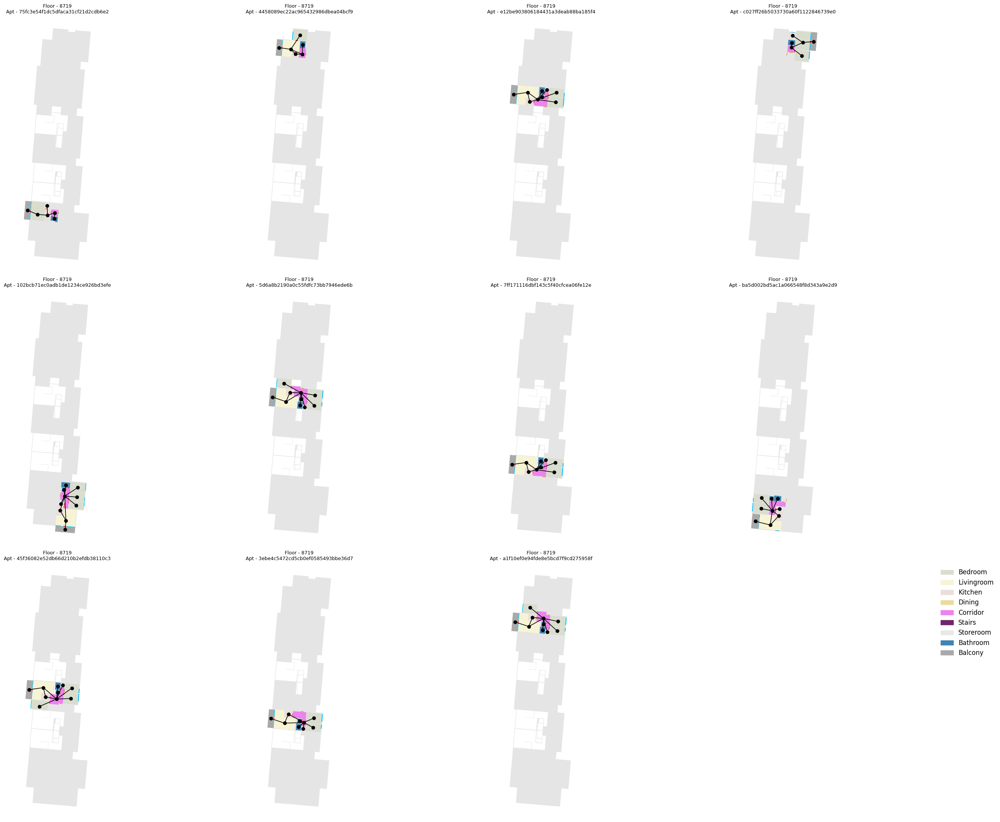

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ----------------------------------------
# Auto grid of subplots
# ----------------------------------------
max_cols = 4                     # max items per row
n_items = len(graphs)
n_cols = min(max_cols, n_items)
n_rows = math.ceil(n_items / max_cols)

fs = 6  # font scale

fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(fs * n_cols * 1.2, fs * n_rows * 1.2)
)

# Ensure axs is a flat array
axs = np.array(axs).reshape(-1)

# ----------------------------------------
# Plot each graph on top of floor plan
# ----------------------------------------
for ax, G in zip(axs, graphs):

    ax.set_aspect('equal')
    ax.axis('off')

    # Plot building structure
    plot_polygon(ax, boundary, facecolor="gray", alpha=0.2)

    # Plot the graph floor plan
    draw_floor_from_graph(
        G, ax,
        s=fs, w=fs/5,
        node_color="black",
        edge_color="black",
        viz_walls=False
    )

    # Title: Floor + Apt ID
    ax.set_title(
        f"Floor - {G.graph['Floor ID']}\nApt - {G.graph['Apt ID']}",
        fontsize=fs * 1.5
    )

# ----------------------------------------
# Hide unused axes if last row is not full
# ----------------------------------------
for i in range(len(graphs), len(axs)):
    axs[i].axis('off')

# ----------------------------------------
# Legend
# ----------------------------------------
patches = [mpatches.Patch(color=c, label=n) for c, n in zip(room_colors, room_names)]

plt.legend(
    handles=patches,
    loc='upper left',
    bbox_to_anchor=(1, 1),
    fontsize=fs * 2,
    frameon=False
)

plt.tight_layout()
plt.show()


Now, we can loop over all floor and extract the apartment graphs from them.

It takes quite a while to extract all the graphs.
You can also do it for the first 30 floor plans to check the code, like we do in the following block:

In [ ]:
graphs = []

# Compute number of apartments
N_apartments = 0
for floor_id in filteredFloorIDs:
    N_apartments += DF[DF.floor_id == floor_id].apartment_id.dropna().nunique()

print(f"Number of apartments in the Dataset:\t{N_apartments}")

#filteredFloorIDs
for floor_id in filteredFloorIDs[:30]:

    # Get apartment IDs within the floor
    apartment_ids = list(DF[DF.floor_id == floor_id].apartment_id.dropna().unique())

    # Loop over the apartments and extract the graphs
    for apartment_id in apartment_ids:
        geoms, cats = get_geometries_from_id(DF, floor_id, apartment_id=apartment_id)
        G = extract_access_graph(geoms, cats, room_names, apartment_id, floor_id)
        graphs.append(G)

    clear_output(wait=True)
    print(f"Apartments done: {len(graphs)} / {N_apartments}")

Apartments done: 651 / 2096


In [ ]:
import pickle

def save_pickle(object, filename):
    """Saves a pickled file."""
    with open(filename, 'wb') as f:
        pickle.dump(object, f)
    f.close()
file_path = r"/content/drive/My Drive/MSD_V2/MSD_export/MSD_IBC_Test_Apartment-Level_Graphs.pickle"# ! change This to your directory
# Saves graphs
save_pickle(graphs, file_path)

Again, we can visualize them (say 10 by 6).

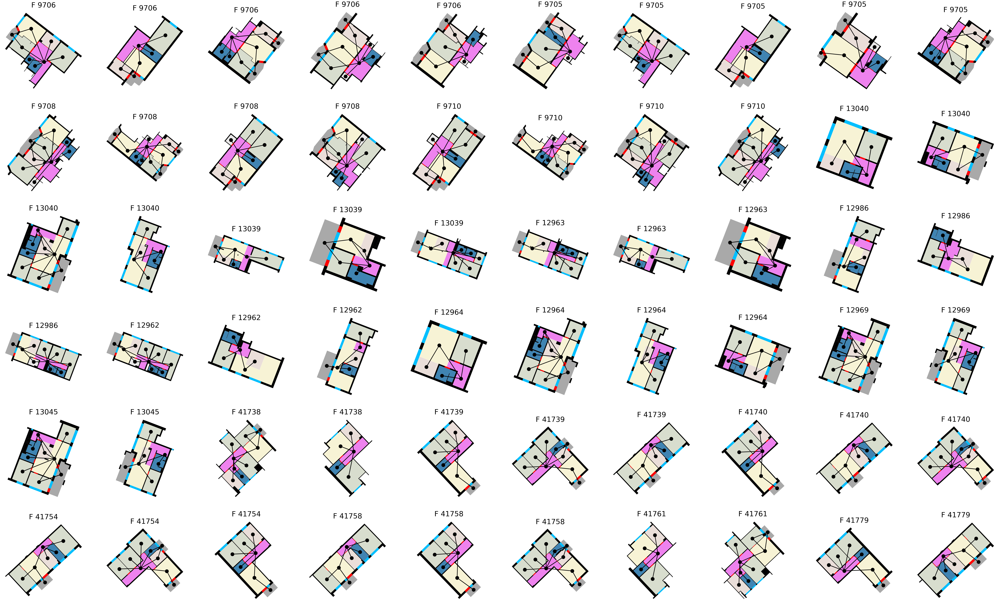

In [ ]:
# Set figure and specs
fs = 10
nc, nr = 10, 6
fig, axs = plt.subplots(nr, nc, figsize=(fs*nc, fs*nr))
axs = axs.flatten()

# Set coloring of graph
node_color = edge_color = "black"

# Loop through apartments
for ax, G in zip(axs, graphs[:len(axs)]):

    # Set axis
    ax.set_aspect('equal')
    ax.axis('off')
    #Put title (floor and apt ID)
    ax.set_title(f"F {G.graph['Floor ID']}", fontsize=fs*4)

    # Plot floor plan + graph
    draw_floor_from_graph(G, ax, s=fs*4, w=fs/3,
                          node_color=node_color,
                          edge_color=edge_color,
                          viz_walls=True,
                          viz_entrances=False)



## (2) Filtering

This section is about removing apartment layouts that are either nearly similar to others (1) are not very informative (e.g., the upper part of an apartment that might only have 1 bedroom) (2).
Why (1)? Too many very similar layouts will slow down and likely bias training.
Why (2)? Good question ...

### Counting storeys in an apartment

Some apartments live at multiple storeys in a building and also some apartments are in building that we are not interested in looking at

Let's plot the histogram of the number of storeys apartments have.
This is easily extracted from the dataframe by counting the number of unique floor IDs can be found when the dataframe is filtered on a particular apartment ID.

Since there are only a few apartments covering multiple storeys, we simply don't consider these apartments.


Number of Apartments in dataset: 18269
Number of UnitIds in dataset: 18902
Apartments that only occupy one floor level: 17683
Apartments that occupy multiple floors: 586


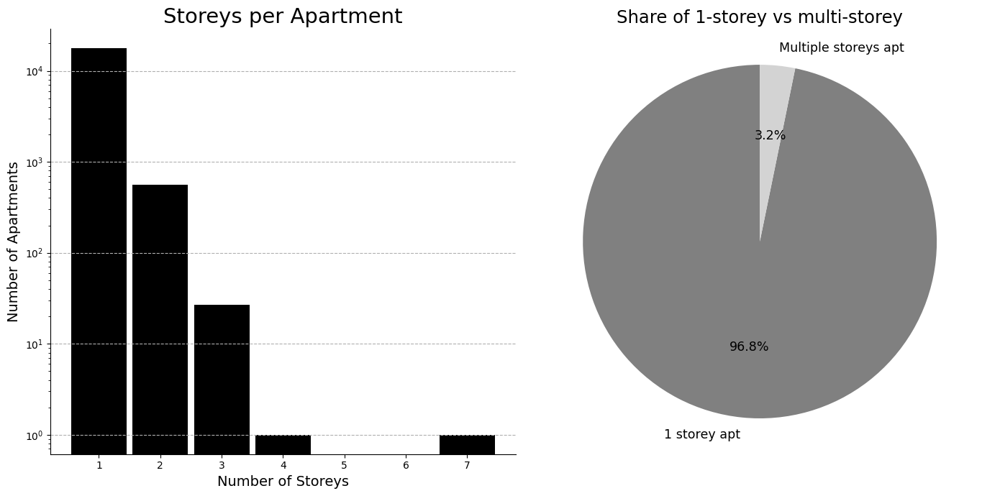

In [ ]:
# Get apartment IDs
apartment_ids = list(DF.apartment_id.dropna().unique())
print("Number of Apartments in dataset:", len(apartment_ids))

# Get unit IDs (Should be more!)
unit_ids = list(DF.unit_id.dropna().unique())
print("Number of UnitIds in dataset:", len(unit_ids))

# Get storeys per apartment dataframe
storeys_per_apartment = DF.groupby('apartment_id')['floor_id'].nunique()

# Identify single-storey apartments
single_apartment_ids = storeys_per_apartment[storeys_per_apartment == 1].index.tolist()
n_single = len(single_apartment_ids)
n_total = len(storeys_per_apartment)
n_multi = n_total - n_single

print("Apartments that only occupy one floor level:", n_single)
print("Apartments that occupy multiple floors:", n_multi)

# ---------- Plots: Histogram + Pie ----------
fs = 7
fig, (ax_hist, ax_pie) = plt.subplots(1, 2, figsize=(fs * 2, fs))

# Histogram of storeys per apartment
ax_hist.hist(
    storeys_per_apartment,
    bins=range(1, storeys_per_apartment.max() + 2),
    color='black',
    align='left',
    log=True,
    rwidth=0.9
)

ax_hist.set_xlabel('Number of Storeys', fontsize=fs * 2)
ax_hist.set_ylabel('Number of Apartments', fontsize=fs * 2)
ax_hist.set_title('Storeys per Apartment', fontsize=fs * 3)
ax_hist.grid(axis='y', linestyle='--', alpha=1)
ax_hist.spines['top'].set_visible(False)
ax_hist.spines['right'].set_visible(False)

# Pie chart: 1-storey vs multi-storey
sizes = [n_single, n_multi]
labels = ['1 storey apt', 'Multiple storeys apt']
colors = ['gray', 'lightgray']

ax_pie.pie(
    sizes,
    labels=labels,
    colors=colors,
    autopct='%1.1f%%',
    startangle=90,
    textprops={'fontsize': fs * 1.8}
)
ax_pie.set_title('Share of 1-storey vs multi-storey', fontsize=fs * 2.5)
ax_pie.axis('equal')  # make it a circle

plt.tight_layout()
plt.show()


### Extracting all apartment graphs that belong to buildings with 2-5 floors AND are single storey

In the next cell, we will convert all the (single-storey) apartments to information-rich graphs and put them together in a list.
This procedure takes quite some time (~30 min, depending on your machine / server).
Make sure to save it afterwards: Loading the list of graphs from your folder takes way less time than repeating the extraction.

In [ ]:
from IPython.display import clear_output

# 1. How many floors each building has
building_floors = (
    DF.dropna(subset=['building_id', 'floor_id'])
      .groupby('building_id')['floor_id']
      .nunique()
)

# 2. Buildings with 2–5 floors
bldgs_2_5 = building_floors[(building_floors >= 2) & (building_floors <= 5)].index

# 3. Floor IDs that belong to those buildings
floor_ids_2_5 = (
    DF[DF.building_id.isin(bldgs_2_5)]
    .floor_id
    .dropna()
    .unique()
    .tolist()
)



target_single_apartments = set(single_apartment_ids) & set(
    DF[DF.building_id.isin(bldgs_2_5)].apartment_id.dropna().unique()
)

print("Buildings with 2–5 floors:", len(bldgs_2_5))
print("Floors in those buildings:", len(floor_ids_2_5))
print("Single-storey apartments in 2–5 floor buildings:", len(target_single_apartments))


Buildings with 2–5 floors: 1560
Floors in those buildings: 4137
Single-storey apartments in 2–5 floor buildings: 13443


In [ ]:
#Extract the graphs from the floorplans that you are interested
graphs = []

# the [:60] to select some of the
for floor_id in floor_ids_2_5[:60]:

    # apartments on this floor
    apartment_ids = (
        DF[DF.floor_id == floor_id]
        .apartment_id.dropna().unique()
    )

    # filter to single-storey
    apartment_ids = list(set(apartment_ids).intersection(single_apartment_ids))

    for apartment_id in apartment_ids:

        geoms, cats = get_geometries_from_id(DF, floor_id, apartment_id=apartment_id)
        G = extract_access_graph(geoms, cats, room_names, apartment_id, floor_id)

        # ---------- add metadata ----------
        G.graph['Apt ID'] = apartment_id
        G.graph['Floor ID'] = floor_id
        G.graph['Building ID'] = (
            DF.loc[DF.floor_id == floor_id, 'building_id']
            .dropna()
            .iloc[0]
        )

        graphs.append(G)

print("Graphs extracted:", len(graphs))

Graphs extracted: 193


Let's visualize a couple of them(like we did before but now we do it from the saved file):

In [ ]:
import random

# Set figure and specs
fs = 10
nc, nr = 5, 10
fig, axs = plt.subplots(nr, nc, figsize=(fs*nc, fs*nr))
axs = axs.flatten()

node_color = edge_color = "black"

# Loop through apartments (pick at random)
random.seed(32)

for ax, G in zip(axs, random.sample(graphs, k=nc*nr)):

    ax.set_aspect('equal')
    ax.axis('off')

    draw_floor_from_graph(
        G, ax,
        s=fs*4, w=fs/3,
        node_color=node_color,
        edge_color=edge_color,
        viz_walls=False,
        viz_entrances=False
    )

    # Building + floor + apt in the title
    ax.set_title(
        f"Building {G.graph['Building ID']}\n"
        f"Floor {G.graph['Floor ID']} | Apt {G.graph['Apt ID']}",
        fontsize=fs * 2.5
    )

plt.tight_layout()
plt.show()


Again: don't forget to save them.
Note that it's about 150MB only!

In [ ]:
#SAVE THE  graphs
gDriveFilePath = f'/content/drive/My Drive/MSD_V2/MSD_IBC_Apartment-Level_Graphs.pickle'
#gDriveFilePath = f'/content/drive/My Drive/MSD_V2/MSD_IBC_Apartment-Level_Graphs_{len(graphs)/1000:.1f}K.pickle'
#So if you're trying to save locally on YOUR computer (your actual Windows machine), *you cannot save directly to C:* from Colab.
localFilepath = f'C:/Users/panz/Documents/GitHub/IBC/MSD_IBC_Apartment-Level_Graphs_{len(graphs)/1000:.1f}K.pickle'
save_pickle(graphs, gDriveFilePath)

Load the graphs

In [ ]:
def load_pickle(filename):
    """
    Loads a pickled file.
    """
    with open(filename, 'rb') as f:
        object = pickle.load(f)
        f.close()
    return object
###NEED TO DOUBLECHECK WHAT YOU LOAD
graphs = load_pickle('/content/drive/My Drive/MSD_V2/MSD_IBC_Apartment-Level_Graphs.pickle')

While many of the floor plans are great, there are many that are not really informative, such as:

- Floor plans that consist of a few number of rooms (some are only bedrooms ...)
- Floor plans without a living room. Reconsidered: We keep them in, there are many apartments without it.

Let's check the sizes (in terms of amount of rooms) of the apartments (1) and number of apartments with a living room more closely (2).

In [ ]:
from tqdm.auto import tqdm

N_rooms = []
N_with_living = 0

for G in tqdm(graphs):
    N_rooms.append(G.number_of_nodes())  # (1)
    # Checks presence of living room among the nodes
    N_with_living += 1 if 1 not in [d for _, d in G.nodes(data="category")] else 0  # (2)

  0%|          | 0/13443 [00:00<?, ?it/s]

In [ ]:
# Print number of apartments that have a living room
print(N_with_living)
print(N_rooms[:50])

3464
[8, 6, 8, 9, 8, 8, 8, 6, 7, 9, 9, 11, 8, 9, 9, 11, 10, 9, 5, 6, 9, 6, 6, 6, 9, 9, 6, 6, 6, 5, 10, 10, 5, 6, 5, 9, 6, 6, 9, 7, 9, 7, 9, 5, 7, 9, 7, 7, 7, 9]


Check distribution of the apartment sizes (i.e., the amount of rooms) through a histogram.

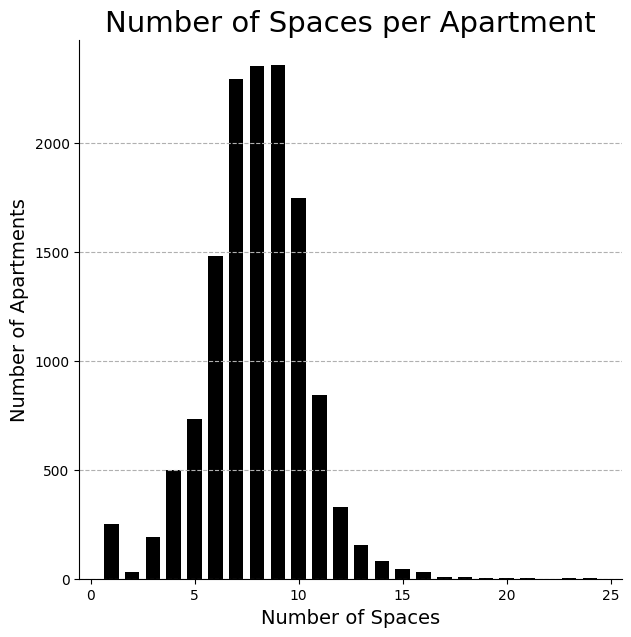

In [ ]:
# Set figure
fs = 7
fig, ax = plt.subplots(1, 1, figsize=(fs, fs))

# Histogram
ax.hist(N_rooms, bins=range(1, np.max(N_rooms) + 2), color='black', align='left', rwidth=0.7)

# Set labels
ax.set_xlabel('Number of Spaces', fontsize=fs*2)
ax.set_ylabel('Number of Apartments', fontsize=fs*2)
_ = ax.set_title('Number of Spaces per Apartment', fontsize=fs*3)

# Set axes
ax.grid(axis='y', linestyle='--', alpha=1)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

We keep all apartments that have between 5 and 7 rooms.
Some apartment are not fully connected.
Here, we keep all apartments that are connected.

In [ ]:
graphs_subset = [G for G in tqdm(graphs) if 3 <= G.number_of_nodes() <= 7]

print(f"Number of apartments with 3-7 rooms: {len(graphs_subset)}")

graphs_subset = [G for G in tqdm(graphs_subset) if nx.is_connected(G)]

print(f"Number of apartments with 3-7 rooms AND connected: {len(graphs_subset)}")

  0%|          | 0/13443 [00:00<?, ?it/s]

Number of apartments with 3-7 rooms: 5197


  0%|          | 0/5197 [00:00<?, ?it/s]

Number of apartments with 3-7 rooms AND connected: 5186


So, ultimately, in the final dataset we have 5186  apartment-level floor plan graphs!!!.

In [ ]:
import random

# Set figure and specs
fs = 10
#number of rows and columns in the figure
nc, nr = 10, 10
fig, axs = plt.subplots(nr, nc, figsize=(fs*nc, fs*nr))
axs = axs.flatten()

# Set coloring of graph
viz_rooms = True
viz_walls = False
viz_entrances = False
viz_doors = True
viz_windows = True
node_color = edge_color ="black" # other option: fuchsia (pink!)

# Loop through apartments (pick at random)
random.seed(30)
for ax, G in zip(axs, random.sample(graphs_subset, k=nc*nr)):

    # Set axis
    ax.set_aspect('equal')
    ax.axis('off')

    # Plot floor plan + graph
    draw_floor_from_graph(G, ax, s=fs*4, w=fs/3,
                          node_color=node_color,
                          edge_color=edge_color,
                          viz_rooms=viz_rooms,
                          viz_walls=viz_walls,
                          viz_entrances=viz_entrances,
                          viz_doors = viz_doors,
                          viz_windows = viz_windows)

    # Put title (floor and apt ID)
    # ax.set_title(f"F {G.graph['Floor ID']}", fontsize=fs*6)

Let's save this 'cleaned' dataset as well:

In [ ]:
gDriveFilePathExport = f'/content/drive/My Drive/MSD_V2/MSD_IBC_Apartment-Level_GraphsCleaned.pickle'
save_pickle(graphs_subset, gDriveFilePath)

## (3) Meta-data analysis

This part of the notebook sheds light on the meta-data of the dataset.

We divide it into three categories:

- Numeric
- Semantic
- Geometric
- Topological

### Numeric

First things first.
The next shows the apartment size distribution (as per number of rooms).
We already did this before, but not for the final dataset!

In [ ]:
N_rooms = [G.number_of_nodes() for G in graphs_subset]

N_rooms_dict = {n: N_rooms.count(n) for n in np.sort(list(set(N_rooms)))}

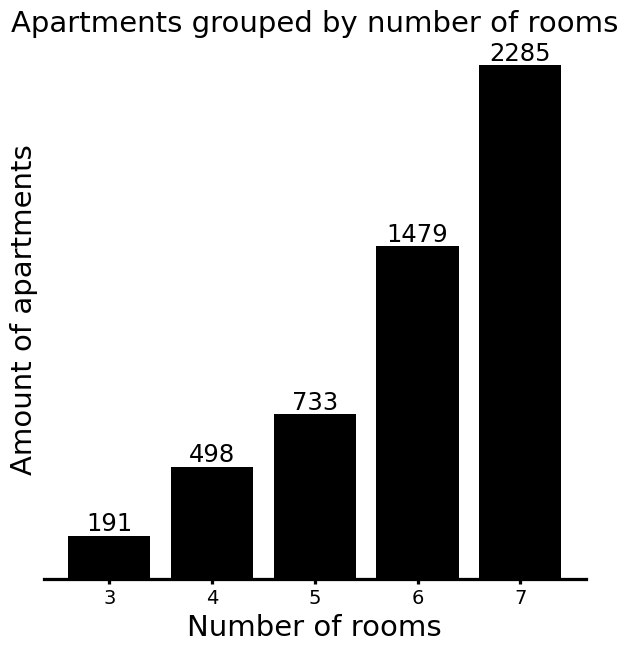

In [ ]:
# Get naming and occurrences for the bars
names = N_rooms_dict.keys()
occurrences = N_rooms_dict.values()

# Set figure
fs = 7
tc = "black"
fig, ax = plt.subplots(1, 1, figsize=(fs, fs))

# Histogram
bars = ax.bar(names, occurrences, color='black')

# Set labels
ax.set_xlabel('Number of rooms', fontsize=fs*3)
ax.set_ylabel('Amount of apartments', fontsize=fs*3)
ax.tick_params(axis='both', width=fs/3, labelsize=fs*2)

# Set axes / spines
ax.spines['bottom'].set_color(tc)
ax.spines['left'].set_color(tc)
ax.spines['bottom'].set_linewidth(fs/3)
ax.spines['left'].set_linewidth(fs/3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

# Hide the y-axis ticks and labels
ax.yaxis.set_ticks([])
ax.yaxis.set_ticklabels([])
_ = ax.set_title('Apartments grouped by number of rooms', fontsize=fs*3)

# Add scores on top of the bars
for bar, occurrence in zip(bars, occurrences):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{occurrence}', ha='center', va='bottom', fontsize=2.5*fs)

### Semantic

We will extract the **room type distribution** i.e., the total number of rooms per room type across the whole dataset.

In [ ]:
# Set classes (int) based on the room names list
classes = list(range(len(room_names)))

# The following creates a list of categories by looping over all the rooms across all graphs
N_room_types = np.concatenate([np.array([cat for _, cat in G.nodes(data="category")]) for G in graphs_subset]).tolist()

# This creates a dictionary: keys are the room types and the values are the number occurrences
# of that room type in the dataset
N_room_type_dict = {room_names[cat]: N_room_types.count(cat) for cat in classes}

# We sort the dictionary by the count of the rooms
N_room_type_dict = dict(sorted(N_room_type_dict.items(), key=lambda item: item[1], reverse=True))

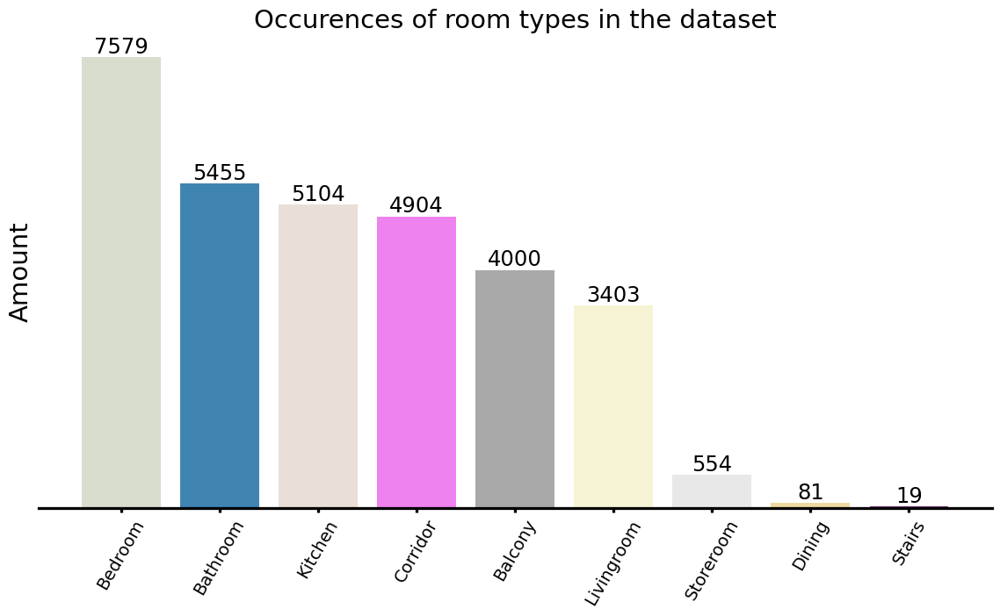

In [ ]:
# Get naming and occurrences for the bars
names = N_room_type_dict.keys()
occurrences = N_room_type_dict.values()

# Set figure
fs = 7
tc = "black"
fig, ax = plt.subplots(1, 1, figsize=(fs*2, fs))

# Histogram
color = [room_colors[room_names.index(cat)] for cat in names]
bars = ax.bar(names, occurrences, color=color)

# Set labels
ax.set_ylabel('Amount', fontsize=fs*3)
ax.tick_params(axis='both', width=fs/3, labelsize=fs*2)

# Set axes / spines
ax.spines['bottom'].set_color(tc)
ax.spines['left'].set_color(tc)
ax.spines['bottom'].set_linewidth(fs/3)
ax.spines['left'].set_linewidth(fs/3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

# Hide the y-axis ticks and labels
ax.yaxis.set_ticks([])
ax.yaxis.set_ticklabels([])
_ = plt.xticks(rotation=60)
_ = ax.set_title('Occurences of room types in the dataset', fontsize=fs*3)
# Add scores on top of the bars
for bar, occurrence in zip(bars, occurrences):
    p = 100 * occurrence / sum(occurrences)  # Computes percentage
    height = bar.get_height()  # Sets the height of the bar in the plot
    ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{occurrence}', ha='center', va='bottom', fontsize=2.5*fs)

### Geometric

We will extract the distributions of the following:
- Gross area (in $m^2$)
- Area per room type (in $m^2$)
- Area of a room type w.r.t. gross area (in %)

The **gross area**, or total area of a floor plan is measured in $m^2$, and computed as the sum over all room areas.

In [ ]:
# Aggregate gross areas in a list
gross_areas = [np.sum([Polygon(d).area for _, d in G.nodes('polygon')]) for G in graphs_subset]

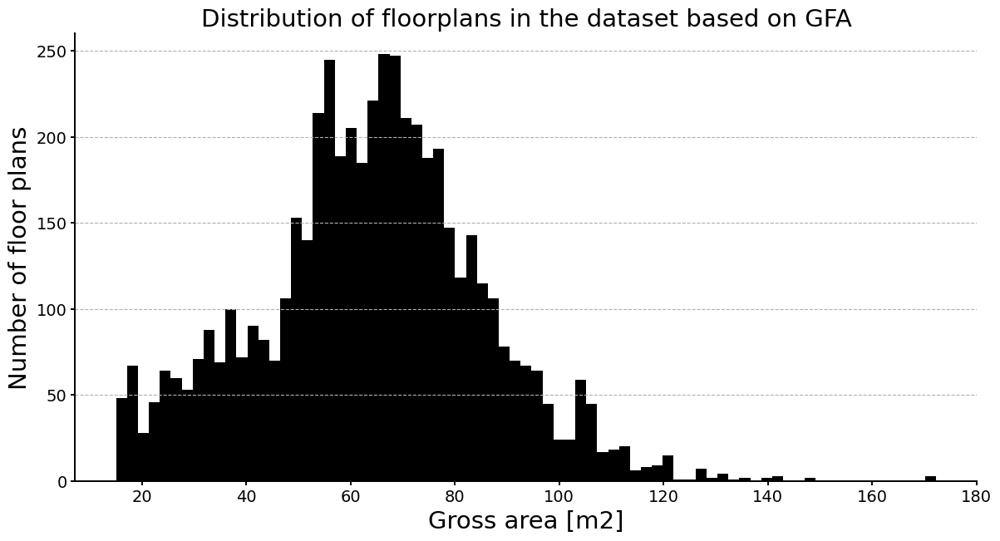

In [ ]:
# Set figure
fs = 7
fc = "white"
tc = "black"
fig, ax = plt.subplots(1,1,figsize=(fs*2, fs))

# Create histogram
bars = ax.hist(gross_areas, bins=75, color="black", align='left', rwidth=1)

# Set color
fig.set_facecolor(fc)
ax.set_facecolor(fc)

# Make up spines
ax.spines['bottom'].set_color(tc)
ax.spines['left'].set_color(tc)
ax.spines['bottom'].set_linewidth(fs/5)
ax.spines['left'].set_linewidth(fs/5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Make up ticks
ax.tick_params(axis='both', width=fs/5, labelsize=fs*2)

# Set grid
ax.grid(axis='y', linestyle='--', alpha=1)

# Make up labels
_ = ax.set_ylabel("Number of floor plans", fontsize=fs*3)
_ = ax.set_xlabel("Gross area [m2]", fontsize=fs*3)
_ = ax.set_title('Distribution of floorplans in the dataset based on GFA', fontsize=fs*3)

We will do the same, but for each room type individually.
So, we'll get the **distribution of area per room type** (on average across the whole dataset).

In [ ]:
# Aggregate room areas in a dict (key indicates the room type)
room_areas_dict = {cat: [] for cat in room_names}

# Loop over graphs and nodes
for G in graphs_subset:
    for _, d in G.nodes(data=True):
        # Extract category
        cat = room_names[d["category"]]
        # Append to the right list in the dictionary
        room_areas_dict[cat].append(Polygon(d["polygon"]).area)

First, we create bar plot.
Each bar represents a room type.
We compute the mean and standard deviation of the list of areas (values in the dictionary) for each room type category (keys in the dictionary).

In [ ]:
# Create dictionary with statistics of the distribution (mean and std)
S_room_areas_dict = {cat: [np.mean(areas), np.std(areas)] for cat, areas in room_areas_dict.items()}

# Sort dictionary on mean area size (descending order)
S_room_areas_dict = dict(sorted(S_room_areas_dict.items(), key=lambda item: item[1][0], reverse=True))

<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:36: SyntaxWarning: invalid escape sequence '\p'
<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:36: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipython-input-2297762003.py:16: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('Area [m2] ($\mu \pm \sigma$)', fontsize=fs*3)
/tmp/ipython-input-2297762003.py:36: SyntaxWarning: invalid escape sequence '\p'
  ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{mean:.1f}$\pm${sig:.1f}', ha='center', va='bottom', fontsize=2.5*fs)


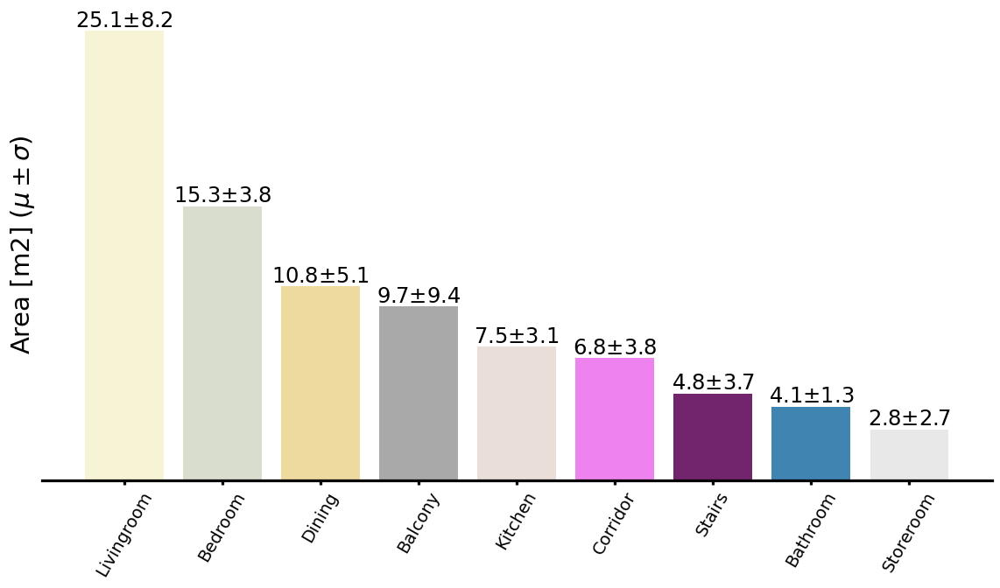

In [ ]:
# Get naming and occurrences for the bars
names = S_room_areas_dict.keys()
means = [m for m,_ in S_room_areas_dict.values()]
sigmas = [sig for _, sig in S_room_areas_dict.values()]

# Set figure
fs = 7
tc = "black"
fig, ax = plt.subplots(1, 1, figsize=(fs*2, fs))

# Histogram
colors = [room_colors[room_names.index(cat)] for cat in names]
bars = ax.bar(names, means, color=colors)

# Set labels
ax.set_ylabel('Area [m2] ($\mu \pm \sigma$)', fontsize=fs*3)
ax.tick_params(axis='both', width=fs/3, labelsize=fs*2)

# Set axes / spines
ax.spines['bottom'].set_color(tc)
ax.spines['left'].set_color(tc)
ax.spines['bottom'].set_linewidth(fs/3)
ax.spines['left'].set_linewidth(fs/3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

# Hide the y-axis ticks and labels
ax.yaxis.set_ticks([])
ax.yaxis.set_ticklabels([])
_ = plt.xticks(rotation=60)

# Add scores on top of the bars
for bar, mean, sig in zip(bars, means, sigmas):
    height = bar.get_height()  # Sets the height of the bar in the plot
    ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{mean:.1f}$\pm${sig:.1f}', ha='center', va='bottom', fontsize=2.5*fs)

To investigate more of the details of the individual area distributions, we can similarly visualize the distributions of each of them (using histograms like for the gross area).
We color the the histograms accordingly.

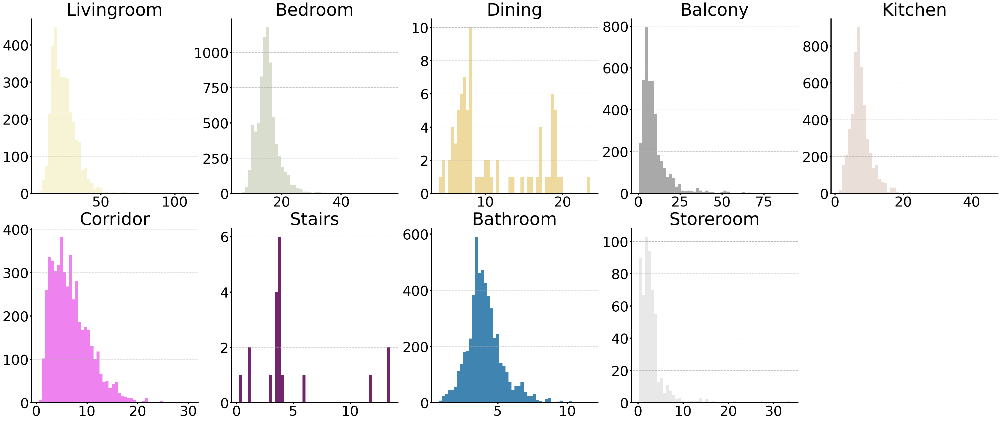

In [ ]:
# Set up figure
fs = 10
fc = "white"
tc = "black"
fig, axs = plt.subplots(2, 5, figsize=(fs*5, fs*2))
axs = axs.flatten()

for ax, cat, color in zip(axs, names, colors):

    # Create histogram
    bars = ax.hist(room_areas_dict[cat], bins=50, color=color)

    # Global coloring
    fig.set_facecolor(fc)
    ax.set_facecolor(fc)

    # Make up spines
    ax.spines['bottom'].set_color(tc)
    ax.spines['left'].set_color(tc)
    ax.spines['bottom'].set_linewidth(fs/3)
    ax.spines['left'].set_linewidth(fs/3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    # ax.spines['left'].set_visible(False)

    # Set lim
    # ax.set_xlim([0, 65])

    # Set grid
    ax.grid(axis='y', linestyle='--', alpha=1)

    # Make up ticks
    _ = plt.xticks(rotation=60)
    ax.tick_params(axis='both', width=fs/3, labelsize=fs*4)

    # Set title
    ax.set_title(cat, fontsize=fs*5)

for i in [-1]:
    axs[i].axis("off")

### Topological

Here, we compute the mean (and standard deviation) NUMBER OF connections per room type.

In [ ]:
# Aggregate connections (i.e., degree) areas in a dict (key indicates the room type)
room_degree_dict = {cat: [] for cat in room_names}

# Loop over graphs and nodes
for G in graphs_subset:
    for n, d in G.nodes(data=True):
        # Extract category
        cat = room_names[d["category"]]
        # Append to the correct list in the dictionary
        room_degree_dict[cat].append(G.degree(n))

In [ ]:
# Create dictionary with statistics of the distribution (mean and std)
S_room_degree_dict = {cat: [np.mean(areas), np.std(areas)] for cat, areas in room_degree_dict.items()}

# Sort dictionary on mean area size (descending order)
S_room_degree_dict = dict(sorted(S_room_degree_dict.items(), key=lambda item: item[1][0], reverse=True))

<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:36: SyntaxWarning: invalid escape sequence '\p'
<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:36: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipython-input-892345115.py:16: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('Degree [-] ($\mu \pm \sigma$)', fontsize=fs*3)
/tmp/ipython-input-892345115.py:36: SyntaxWarning: invalid escape sequence '\p'
  ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{mean:.1f}$\pm${sig:.1f}', ha='center', va='bottom', fontsize=2.5*fs)


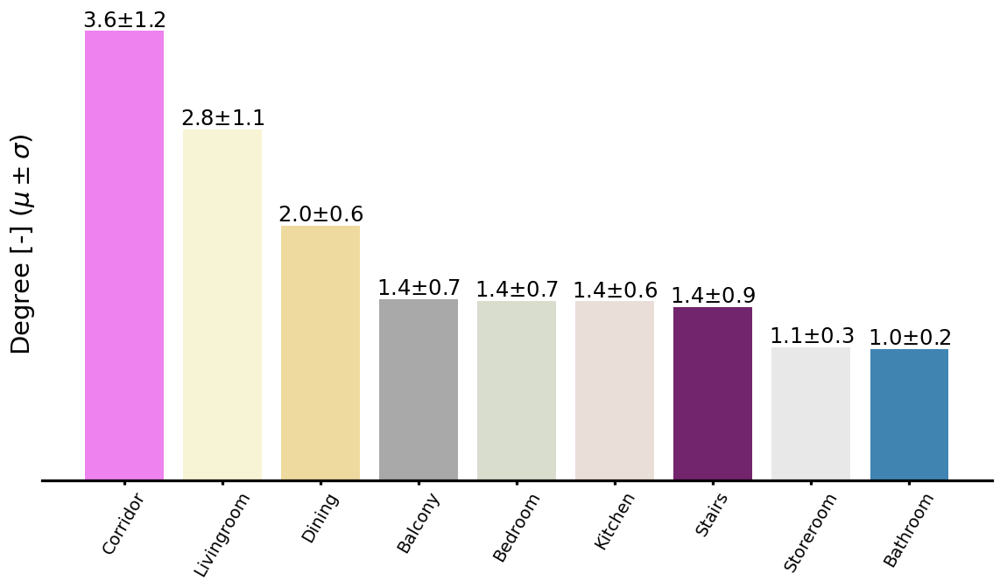

In [ ]:
# Get naming and occurrences for the bars
names = S_room_degree_dict.keys()
means = [m for m,_ in S_room_degree_dict.values()]
sigmas = [sig for _, sig in S_room_degree_dict.values()]

# Set figure
fs = 7
tc = "black"
fig, ax = plt.subplots(1, 1, figsize=(fs*2, fs))

# Histogram
colors = [room_colors[room_names.index(cat)] for cat in names]
bars = ax.bar(names, means, color=colors)

# Set labels
ax.set_ylabel('Degree [-] ($\mu \pm \sigma$)', fontsize=fs*3)
ax.tick_params(axis='both', width=fs/3, labelsize=fs*2)

# Set axes / spines
ax.spines['bottom'].set_color(tc)
ax.spines['left'].set_color(tc)
ax.spines['bottom'].set_linewidth(fs/3)
ax.spines['left'].set_linewidth(fs/3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

# Hide the y-axis ticks and labels
ax.yaxis.set_ticks([])
ax.yaxis.set_ticklabels([])
_ = plt.xticks(rotation=60)

# Add scores on top of the bars
for bar, mean, sig in zip(bars, means, sigmas):
    height = bar.get_height()  # Sets the height of the bar in the plot
    ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{mean:.1f}$\pm${sig:.1f}', ha='center', va='bottom', fontsize=2.5*fs)